##  Udacity Self-Driving Car Project

### Advanced Lane Finding by Fan Jiang

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


### 1. compute the camera calibration matrix and distortion coefficients given a set of chessboard images

##### To compute the camera calibration matrix and distortion coefficients, I use photos of chessboard as example and several functions are picked from cv2 library.

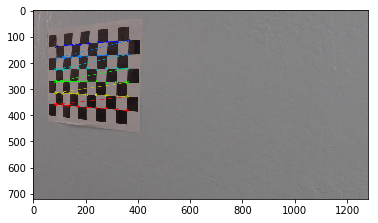

In [1]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

nx = 9
ny = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) #x, y coordinate

# Step through the image list and search for chessboard corners
for i in range(1,20):
    
    # read in each image
    imageName = 'camera_cal/calibration{}.jpg'.format(i)
    img = cv2.imread(imageName)
    
    # Convert image to gray scale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        # Write out to disk
        #saveName = 'draw_corner'+str(i)+'.jpg'
        #cv2.imwrite(saveName, img)
        plt.imshow(img)

### 2. Apply a distortion correction to raw images.

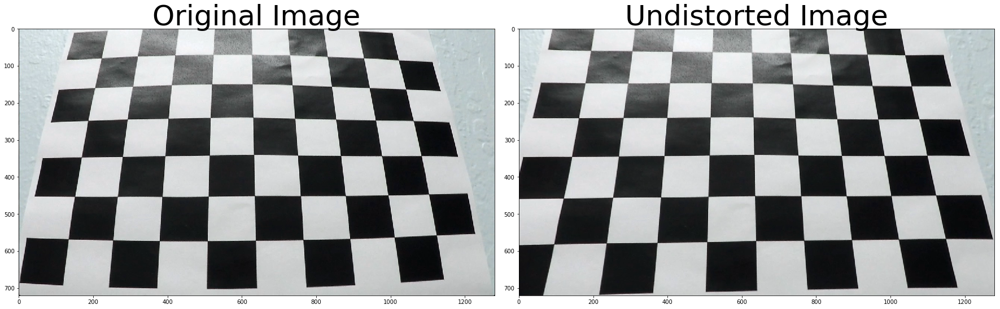

In [2]:
#Test one of chessboard image to undistort image

imageName = 'camera_cal/calibration{}.jpg'.format(3)
img = cv2.imread(imageName)
img_size = (img.shape[1], img.shape[0])

# Perform camera calibration by given image points and object points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Perform image undistortion
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('2_undistort_images/undist_image1.jpg',dst)

# Save the camera calibration result for future use
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "saved_dist_pickle.p", "wb" ) )

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



#### Test on chessboard image

Define undistort function and test on road image

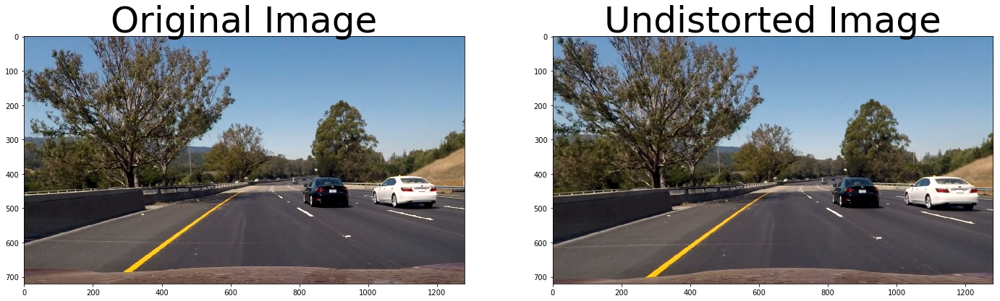

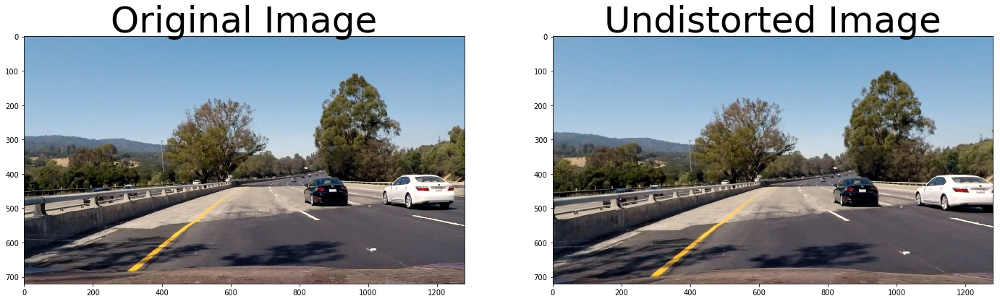

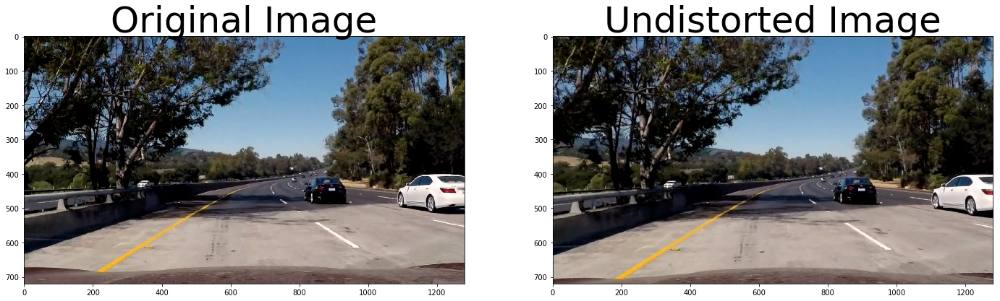

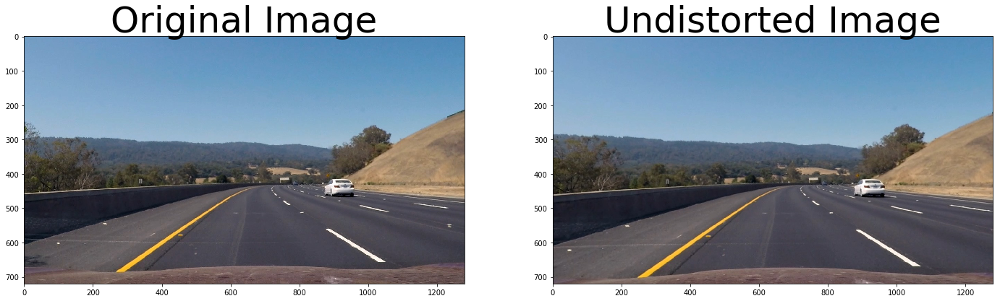

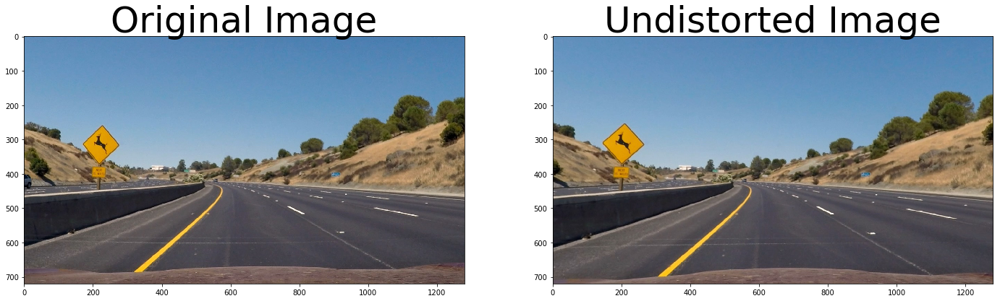

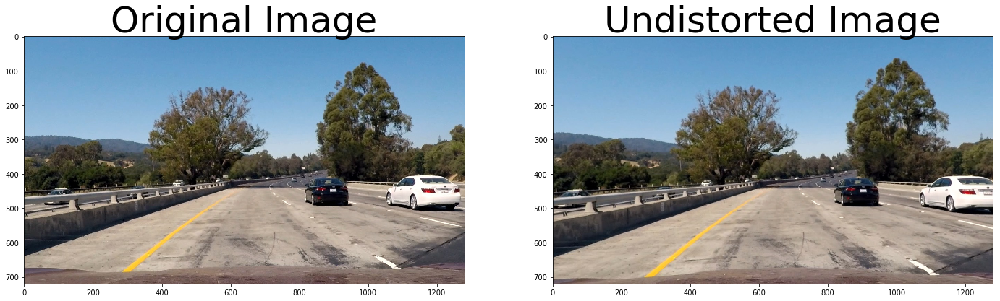

In [10]:
def undistort(image, display=True, read = True):
    if read:
        image = cv2.imread(image)
    img_size = (image.shape[1], image.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Image', fontsize=50)
    else:
        return undist
    
images = glob.glob('test_images/test*.jpg')
for image in images:
    imageundistort = undistort(image)    
    # Write out to disk
    saveName = 'undistorted'+str(i)+'.jpg'
    cv2.imwrite(saveName, imageundistort)

### 3. Use color transforms, gradients, etc., to create a thresholded binary image.

In [11]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate gradient
    # Convert to gray scale
    #gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    if orient == 'x':
        sobel = cv2.Sobel(img,cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(img,cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        
    # Absolute value
    sobel = np.absolute(sobel)
    # Resacle to 8 bit integer
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresh[0]) & (scaled_sobel < thresh[1]) ] = 1
    # Return result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    
    # Convert to gray scale
    #gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y seperately
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # Calculate the magnitude
    mag = np.sqrt(sobelx**2 + sobely**2)
    # Scale to 8 bit
    scaled_mag = np.uint8(255*mag/np.max(mag))
    # Create ninary mask 
    mag_binary = np.zeros_like(scaled_mag)
    mag_binary[(scaled_mag > mag_thresh[0]) & (scaled_mag < mag_thresh[1])] = 1

    return mag_binary

def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Gray sclae
    #gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the graident in x and y
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # Take the absolute value
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # Calculate the direction of the gradient
    direction_gradient = np.arctan2(abs_sobely,abs_sobelx)
    # Create binary mask
    dir_binary = np.zeros_like(direction_gradient)
    dir_binary[(direction_gradient >= thresh[0]) & (direction_gradient <= thresh[1])] = 1
    return dir_binary

#def hls_select(img, thresh=(0,255)):
#    # Convert to HLS space
#    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
#    # Apply threshold to S channel
#    s_channel = hls[:,:,2]
#    # Return a binary output
#    binary_output = np.zeros_like(s_channel)
#    binary_output[(s_channel > thresh[0]) & (s_channel < thresh[1])] = 1   
#    return binary_output

print("Pre-defined functions for edge detection")

Pre-defined functions for edge detection


In the following section, I use combined edge detections method to detect the edges from 7 test images, they are listed below: 

* HLS color thresholding
* Sober operator x direction
* Sober operator y direction
* Magnitude of Gradient
* Direction of Gradient

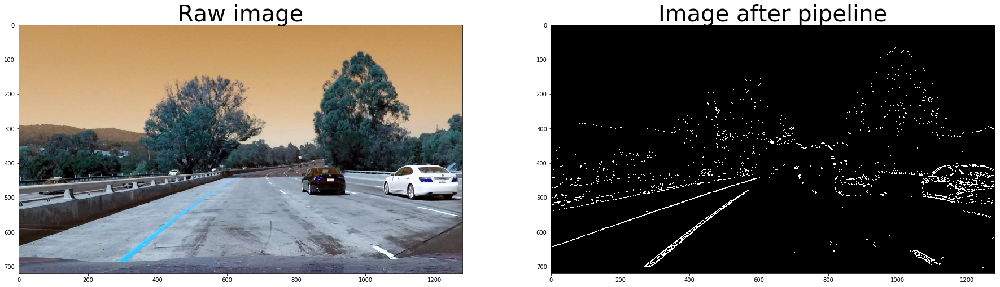

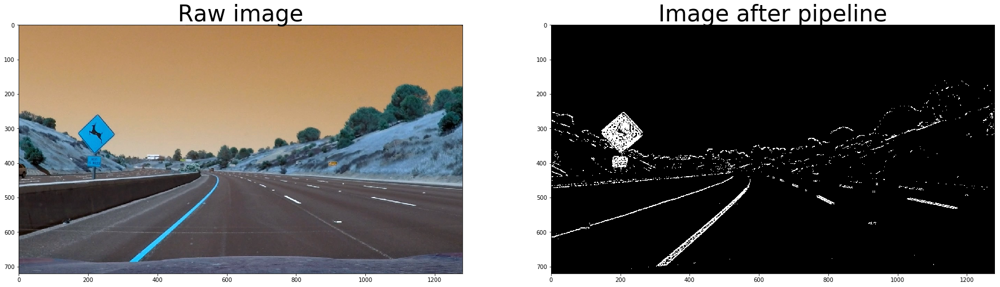

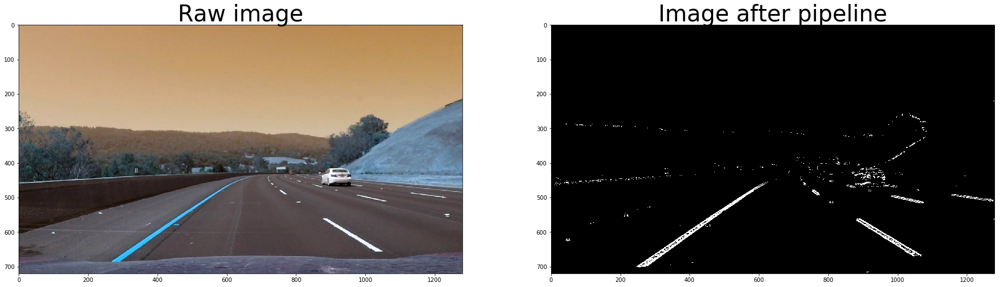

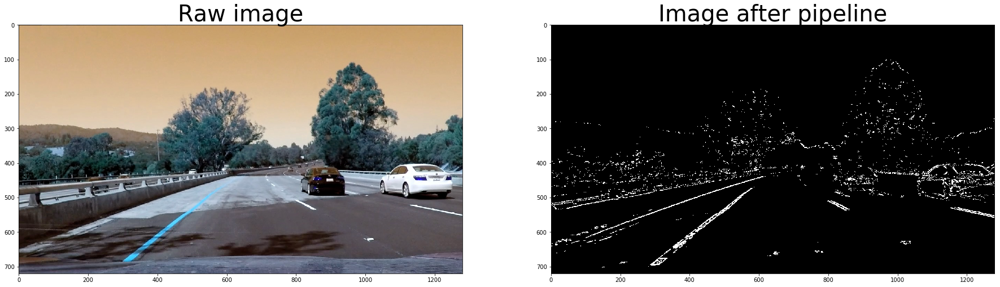

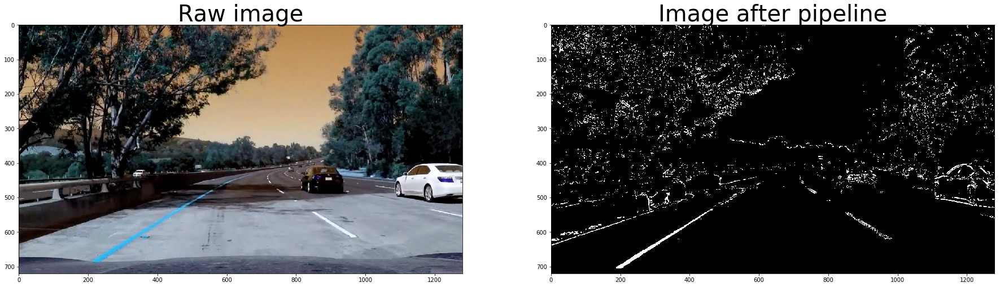

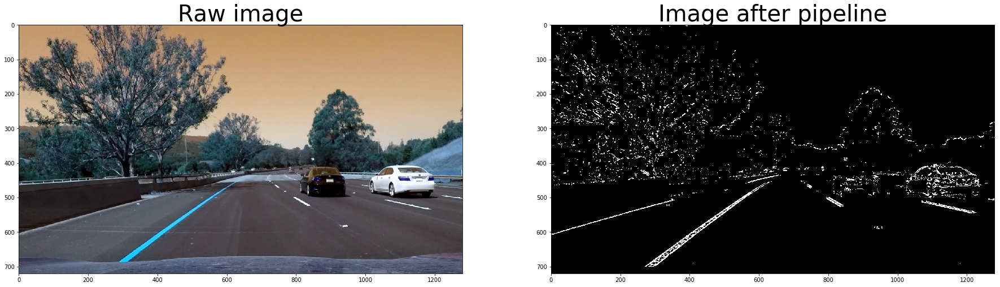

In [14]:
# Define pipeline to process image based above functions
def pipelineForEdgeDection(img):
    img = np.copy(img)
    
    img = undistort(img,display=False, read = False)    
    
    # Convert to HLS color space and seperate the s channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    #l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Gray image
    # Test color image
   # gray = img #cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Define soble kernel size
    ksize = 7
    
    # Apply each of functions defined above
    gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=ksize, thresh=(15, 255))
    grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=ksize, thresh=(80, 255))
    mag_binary = mag_thresh(gray, sobel_kernel=ksize, mag_thresh=(60, 255))
    dir_binary = dir_thresh(gray, sobel_kernel=ksize, thresh=(0.65, 1.1))
    
    # Combine all threshold
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & grady == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Color channel threshold
    s_binary = np.zeros_like(combined)
    s_binary[(s_channel > 180) & (s_channel < 255)] = 1
    
    color_binary = np.zeros_like(combined)
    color_binary[(s_binary > 0) | (combined > 0)] = 1
    
    return color_binary

for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    image = cv2.imread(fname)
    result = pipelineForEdgeDection(image)
    
    # Write out to disk
    saveName = 'pipeline'+str(i)+'.jpg'
    cv2.imwrite(saveName, result)
    
    # Try to plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
    ax1.imshow(image)
    ax1.set_title('Raw image', fontsize = 40)    
    ax2.imshow(result, cmap='gray')
    ax2.set_title('Image after pipeline', fontsize = 40)    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.0)    

### 4. Apply a perspective transform to rectify binary image ("birds-eye view").

#### Define function corners_unwarp() to unwarp the lanes to a "birds eye" view, which focus on lane lines to make them appear to be relatively parallel to each other. This is a pre step to fit polynomials in next step

In [15]:
# Define image shape
image_shape = image.shape
print("image shape:",image_shape)

# Define the region the idea is from Lee
area_of_interest = [[150+430,460],[1150-440,460],[1150,720],[150,720]]

# Define a function to unwrap corner information which will takes 
# an image, 
# number of x and y points, 
# camera matrix,
# distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Choose an offset from image corners to plot detected corners
    os1 = 200 # offset for dst points x value
    os2 = 0 # offset for dst points bottom y value
    os3 = 0 # offset for dst points top y value
    # Calculate the image shape
    img_size = (gray.shape[1], gray.shape[0])
    # Use outer 4 points as cornor points
    src = np.float32(area_of_interest)
    # Choose some points to be a good fit for displaying the warped result 
    dst = np.float32([[os1, os3], 
                      [img_size[0]-os1, os3], 
                      [img_size[0]-os1, img_size[1]-os2], 
                      [os1, img_size[1]-os2]])
    # Calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)
    # Return the resulting image and matrix
    return warped, M, Minv


image shape: (720, 1280, 3)


Since corners_warp function is created, we can use this function to detect lans and the shade of areas.

In [16]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #x values in windows
        self.windows = np.ones((3,12))*-1
        
print("Class Line is defined")

Class Line is defined


Let's see how bird's eye view looks like

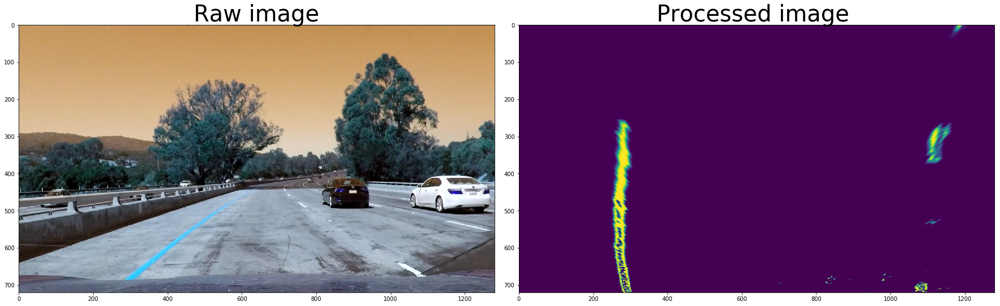

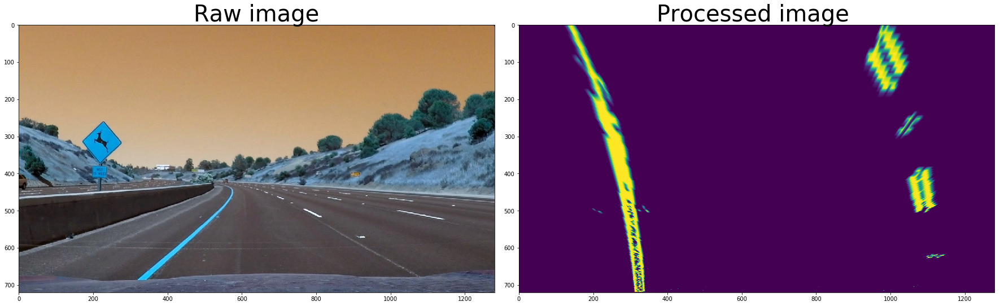

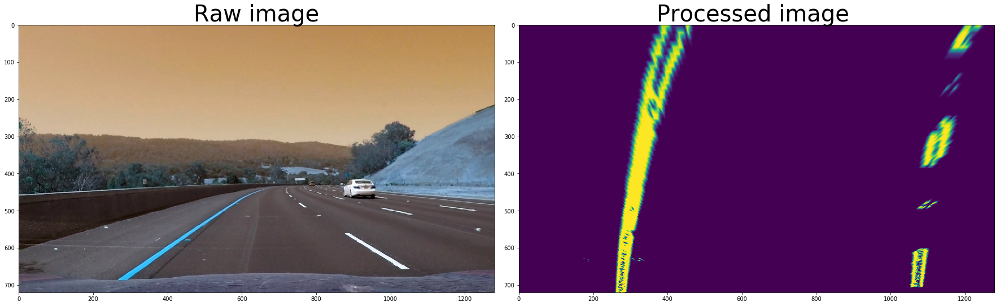

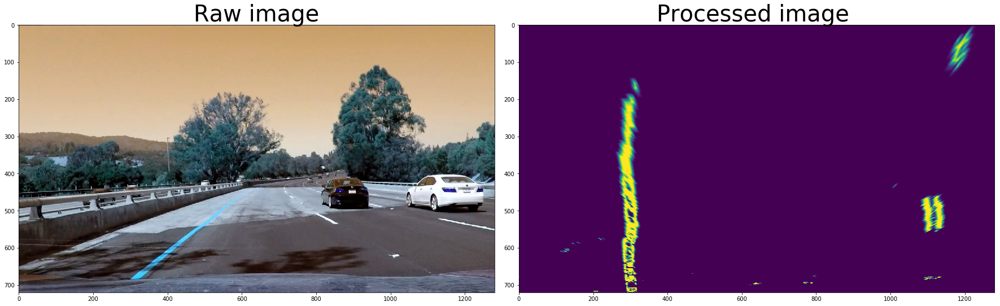

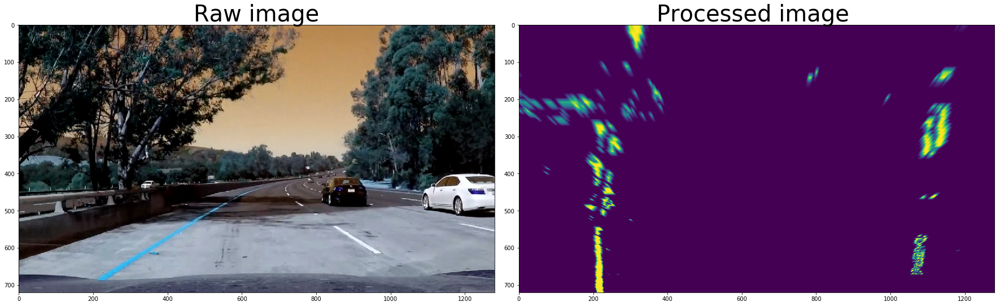

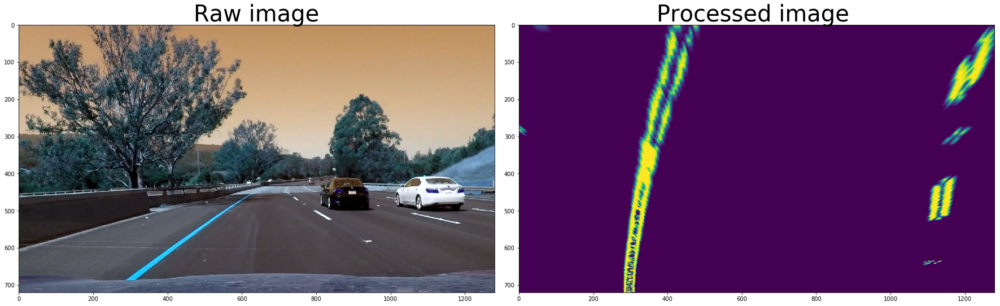

In [17]:
for i in range(1,7):
    # Set up lines for left and right
    left_lane = Line()
    right_lane = Line()
    # load the image
    fname = 'test_images/test{}.jpg'.format(i)
    img_raw = cv2.imread(fname)
    # Apply pipeline to the image to create edge detected image
    img = pipelineForEdgeDection(img_raw)
    # Unwrap the image
    top_down, perspective_M, perspective_Minv = corners_unwarp(img, nx, ny, mtx, dist)
    
    # Write out to disk
    saveName = 'birdsview'+str(i)+'.jpg'
    cv2.imwrite(saveName, top_down)
    
    # Try to plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
    f.tight_layout()
    
    ax1.imshow(img_raw)
    ax1.set_title('Raw image', fontsize = 40)
    
    ax2.imshow(top_down)
    ax2.set_title('Processed image ', fontsize = 40)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.0)

Now we have processed image to "bird's eye view", then we need to implement sliding windows and fit a polynomial

### 5. Detect lane pixels and fit to find the lane boundary.
#### First, define fit_lanes function to find lanes from picture;
#### then, determine the curvature of the lane and vehicle position with respect to center.

In [18]:
def find_position(pts):
    # Find the position of the car from the center
    # It will show if the car is 'x' meters from the left or right
    position = image_shape[1]/2
    left  = np.min(pts[(pts[:,1] < position) & (pts[:,0] > 700)][:,1])
    right = np.max(pts[(pts[:,1] > position) & (pts[:,0] > 700)][:,1])
    center = (left + right)/2
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension    
    return (position - center)*xm_per_pix

In [19]:
def fit_lanes(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
   
    # Create an output image to draw on and  visualize the result
    yvals = np.linspace(0, 100, num=101)*7.2  # to cover same y-range as image
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        #print(win_y_low,win_y_high,win_xleft_low,win_xleft_high,win_xright_low,win_xright_high)
        # Draw the windows on the visualization image
        #cv2.rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]]) → None
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
#     ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
#     quadratic_coeff = 3e-4 # arbitrary quadratic coefficient   
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]

    y_eval = np.max(yvals)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr  = np.polyfit(yvals*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(yvals*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
   
    return out_img,left_fitx,right_fitx,leftx,lefty,rightx,righty,left_curverad
   

Below subroutine is used to draw poly line on images

In [23]:
#def draw_poly(image, top_down, a, b, c, lx, ly, rx, ry, perspective_Minv, curvature):
def draw_poly(image, warped, yvals, left_fitx, right_fitx, 
              left_lane_x, left_lane_y, right_lane_x, right_lane_y, Minv, curvature):
    # Undistort the image
    image = undistort(image,display=False, read = False)    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    # Put text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2)
    # Find the position of the car
    pts = np.argwhere(newwarp[:,:,1])
    
    position = find_position(pts)

    if position < 0:
        text = "Vehicle is {:.2f} m left of center".format(-position)
    else:
        text = "Vehicle is {:.2f} m right of center".format(position)
    cv2.putText(result,text,(400,150), font, 1,(255,255,255),2)
    return result

print("Prepare to draw a polygon on the image.")    

Prepare to draw a polygon on the image.


### 6.Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

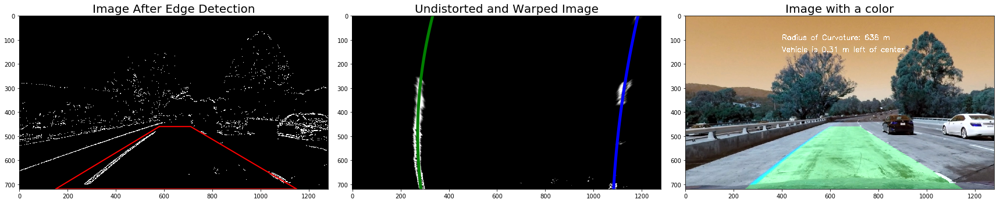

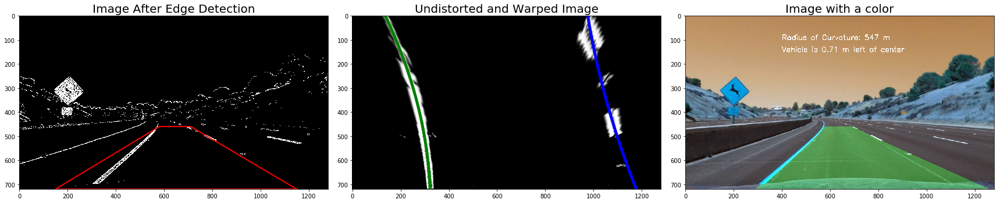

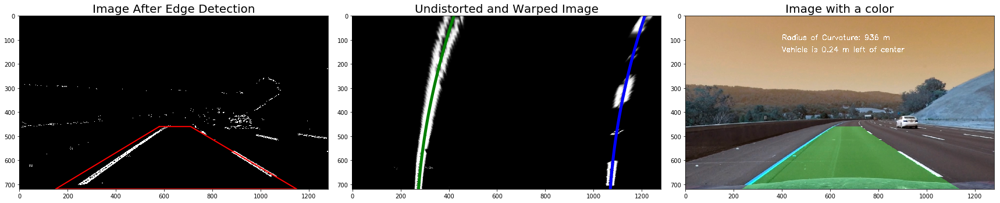

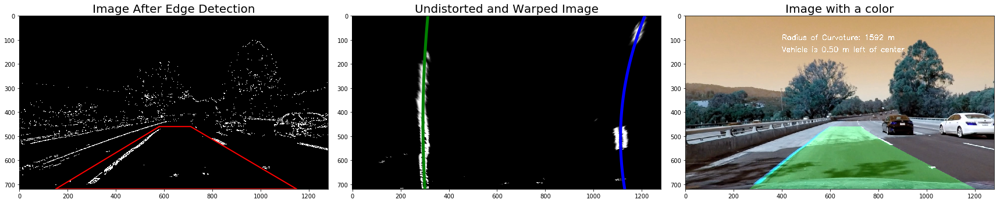

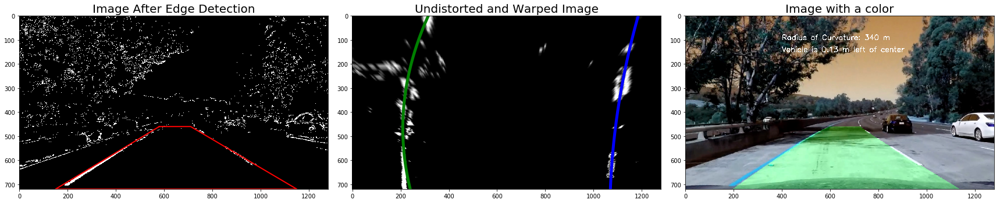

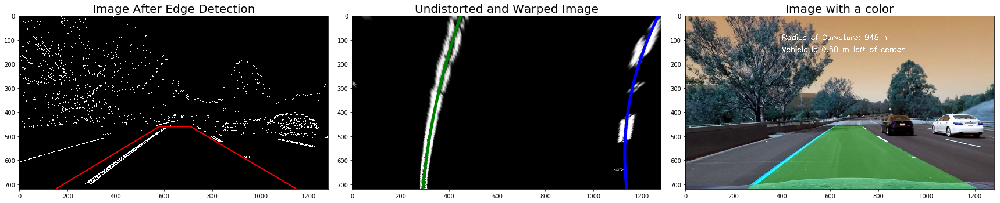

In [24]:
#import numpy as np
#import cv2
#import matplotlib.pyplot as plt
margin = 100
x_values = [area_of_interest[0][0],area_of_interest[1][0],area_of_interest[2][0],area_of_interest[3][0],area_of_interest[0][0]]
y_values = [area_of_interest[0][1],area_of_interest[1][1],area_of_interest[2][1],area_of_interest[3][1],area_of_interest[0][1]]

for i in range(1,7):
    # Set up lines for left and right
    left_lane = Line()
    right_lane = Line()
    # load the image
    fname = 'test_images/test{}.jpg'.format(i)
    img_raw = cv2.imread(fname)

    # Apply pipeline to the image to create black and white image

    img = pipelineForEdgeDection(img_raw)
    # Unwrap the image

    top_down, perspective_M, perspective_Minv = corners_unwarp(img, nx, ny, mtx, dist)

    # Find lanes from the warped image
    
    #set up plot layout
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    # Showing the image from edgedetected pipeline with marked areas
    ax1.set_title('Image After Edge Detection', fontsize=20)
    ax1.plot(x_values,y_values,'r-',lw=2)
    ax1.imshow(img, cmap='gray')
    
    # Find lanes from the binary warped images
    out_img,left_fitx,right_fitx,leftx,lefty,rightx,righty,curvature = fit_lanes(top_down)
    window_img = np.zeros_like(out_img)
    ypts = np.linspace(0, 100, num=101)*7.2  # to cover same y-range as image
    ax2.plot(left_fitx, ypts, color='green', linewidth=5)
    ax2.plot(right_fitx, ypts, color='blue', linewidth=5)
    ax2.imshow(top_down, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=20)
    
    image_color = draw_poly(img_raw, top_down, ypts, left_fitx, right_fitx, 
              leftx, lefty, rightx, righty, perspective_Minv, curvature)
    ax3.imshow(image_color)
    ax3.set_title('Image with a color', fontsize=20)

## Design video processing

In [25]:
def processing_image(image):
    # edge detection pipeline
    img = pipelineForEdgeDection(image)
    # warp the image 
    top_down, perspective_M, perspective_Minv = corners_unwarp(img, nx, ny, mtx, dist)
    # find lanes from the warped image
    out_img,left_fitx,right_fitx,leftx,lefty,rightx,righty,curvature = fit_lanes(top_down)
    # draw the original image with color region
    ypts = np.linspace(0, 100, num=101)*7.2  # to cover same y-range as image
    image_color = draw_poly(image, top_down, ypts, left_fitx, right_fitx, 
              leftx, lefty, rightx, righty, perspective_Minv, curvature) 
    return image_color

In [26]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Set up lines for left and right
left_lane = Line()
right_lane = Line()
processed_video = 'output_lane.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(processing_image)
%time white_clip.write_videofile(processed_video, audio=False)

[MoviePy] >>>> Building video output_lane.mp4
[MoviePy] Writing video output_lane.mp4


100%|█████████▉| 1260/1261 [23:08<00:01,  1.15s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_lane.mp4 

CPU times: user 28min 50s, sys: 3.67 s, total: 28min 54s
Wall time: 23min 8s
